In [1]:
import numpy as np
import matplotlib
import sys, platform, os
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import camb

from camb import model, initialpower

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from my_functions import * # the module of functions

Passaggi     = Power spectrum T, E, B -> Perturbo E_pert, B_pert -> Mappe E, B, E_pert, B_pert ->
               PS T2, E2, B2, E_pert2, B_pert2

Confronto PS = E, E2, E_pert, E_pert2 ----
               B, B2, B_pert, B_pert2

------------------------------------------

T, E, B sono i PS originali

T2, E2, B2 sono i PS ricavati dalle mappe originali

E_pert, B_pert sono i PS perturbati

E_pert2, B_pert2 sono i PS ricavati dalle mappe perturbate

# Power spectrum

In [2]:
# Leggo i PS generati da in Notebook_comune
Original_PS = np.loadtxt('C:/Users/guide/Documents/University/TESI/dati/Original_PS_001.txt')

In [3]:
TT_ps  = Original_PS[0]
TE_ps  = Original_PS[1]
EE_ps  = Original_PS[2]
BB_ps  = Original_PS[3]
BB_ps_tensor  = Original_PS[4]

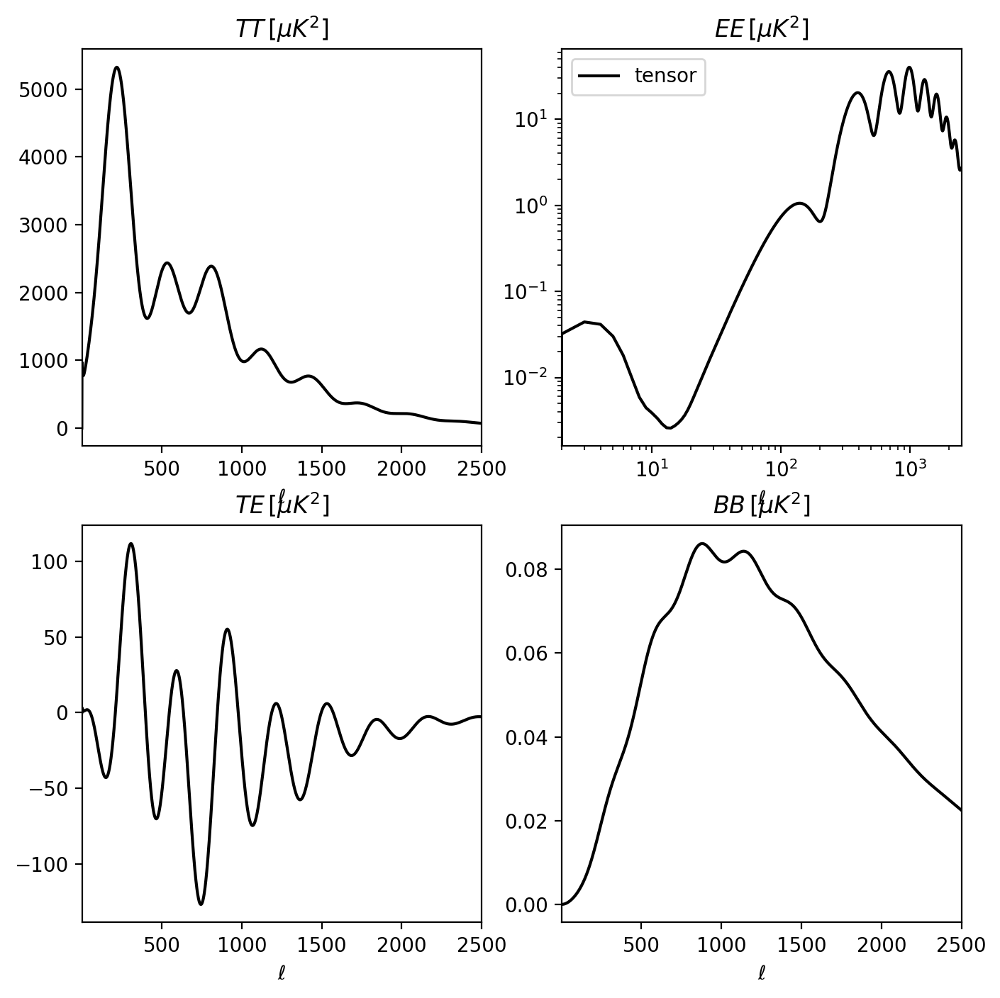

In [4]:
#plot the total lensed CMB power spectra versus unlensed, and fractional difference

ls = np.arange(TT_ps.shape[0])
fig, ax = plt.subplots(2,2, figsize = (8,8))

# TT
ax[0,0].plot(ls,TT_ps, color='k')
ax[0,0].set_title(r'$TT\, [\mu K^2]$')

#TE
ax[1,0].plot(ls,TE_ps, color='k')
ax[1,0].set_title(r'$TE\, [\mu K^2]$')

#EE
ax[0,1].loglog(ls,EE_ps, color='k', label="tensor")
ax[0,1].set_title(r'$EE\, [\mu K^2]$')
ax[0,1].legend()

# BB
ax[1,1].plot(ls,BB_ps, color='k')
ax[1,1].set_title(r'$BB\, [\mu K^2]$')

for ax in ax.reshape(-1): 
    ax.set_xlim([2,2500])
    ax.set_xlabel(r'$\ell$')

# Perturbazione angolo di polarizzazione
Perturbo l'angolo di polarizzazione direttamente sul PS usando la formula 4.1 qui https://arxiv.org/pdf/2008.11049.pdf


$Cl_{EE,obs} = Cl_{EE} * cos^2(2∆α) + Cl_{BB} * sin^2(2∆α)$

$Cl_{BB,obs} =Cl_{BB} * cos^2(2∆α) + Cl_{EE} * sin^2(2∆α).$



Utilizzando la matrice di rotazione
\begin{bmatrix}
cos & -sin \\
sin & cos  \\
\end{bmatrix}

In [5]:
angle_degree = 0.1
alpha = np.deg2rad(angle_degree) #radiants

print(alpha)

0.0017453292519943296


In [6]:
'''
def polangle_ps(EE_ps, BB_ps, alpha):
    EE_ps_pert = EE_ps * (np.cos(2*alpha))**2 + BB_ps * (np.sin(2*alpha))**2
    BB_ps_pert = BB_ps * (np.cos(2*alpha))**2 + EE_ps * (np.sin(2*alpha))**2
    
    return (EE_ps_pert, BB_ps_pert)
'''

'\ndef polangle_ps(EE_ps, BB_ps, alpha):\n    EE_ps_pert = EE_ps * (np.cos(2*alpha))**2 + BB_ps * (np.sin(2*alpha))**2\n    BB_ps_pert = BB_ps * (np.cos(2*alpha))**2 + EE_ps * (np.sin(2*alpha))**2\n    \n    return (EE_ps_pert, BB_ps_pert)\n'

In [7]:
EE_ps_pert, BB_ps_pert = polangle_ps(EE_ps, BB_ps_tensor, alpha)

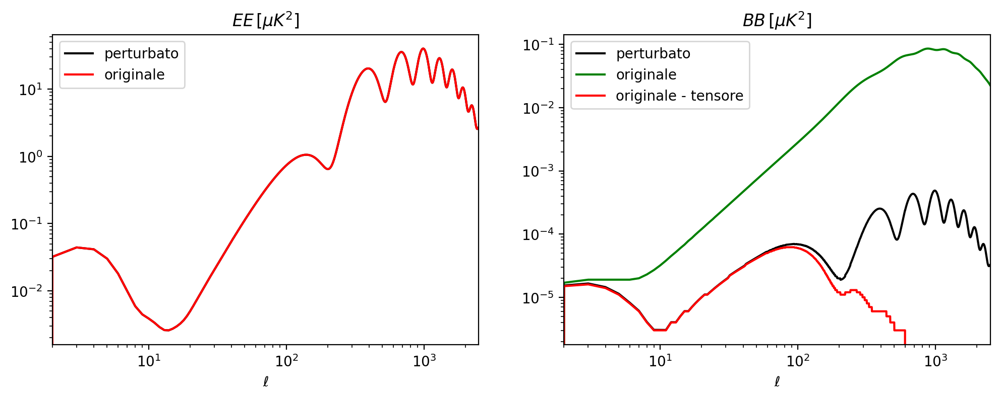

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))  

ax[0].loglog(ls,EE_ps_pert, color='k', label='perturbato')
ax[0].loglog(ls,EE_ps, color='r', label='originale')
ax[0].set_title(r'$EE\, [\mu K^2]$')
ax[0].legend()

ax[1].loglog(ls,BB_ps_pert, color='k', label='perturbato')
ax[1].loglog(ls,BB_ps, color='g', label='originale')
ax[1].loglog(ls,BB_ps_tensor, color='r', label='originale - tensore')
ax[1].set_title(r'$BB\, [\mu K^2]$')
ax[1].legend()

for ax in ax.reshape(-1): 
    ax.set_xlim([2,2500])
    ax.set_xlabel(r'$\ell$')

# Map E, B, Q, U, E pert, B pert, Q pert, U pert

In [9]:
# parametri mappa

pix_size = 0.5    #arcmin
N        = 2**10  #num pixel lineare
X_width, Y_width = N*pix_size/60., N*pix_size/60.   #dimensioni mappa in gradi

c_min, c_max     = -200, 200                        #color map

#se voglio invece partire da una dimensione fissata di mappa e pixel, uso questa formula per trovare quanti pixel mi servono
#N = (X_width * 60)/ pix_size #pixel number


print(f"Mappa con {N} x {N} pixels, ognuno di {pix_size} arcmin, per una dimensione totale di {X_width:.2f} x {Y_width:.2f} gradi")


nbig = 5000

Mappa con 1024 x 1024 pixels, ognuno di 0.5 arcmin, per una dimensione totale di 8.53 x 8.53 gradi


In [10]:
# MAPPE ORIGINALI

ell_big = np.arange(nbig)

TT_ps_big = np.zeros(nbig)
TT_ps_big[ls.astype(int)] = TT_ps

EE_ps_big = np.zeros(nbig)
EE_ps_big[ls.astype(int)] = EE_ps

BB_ps_big = np.zeros(nbig)
BB_ps_big[ls.astype(int)] = BB_ps

TE_ps_big = np.zeros(nbig)
TE_ps_big[ls.astype(int)] = TE_ps

ell    = ell_big
ps_TT  = TT_ps_big + 1e-3   
ps_EE  = EE_ps_big + 1e-3
ps_BB  = BB_ps_big + 1e-3
ps_TE  = TE_ps_big

Temp_point_source_spectrum = ps_TT[1000]*(ell/3000.)**2.
Pol_point_source_spectrum  = ps_EE[1500]*(ell/4500.)**2.

ps_TT = ps_TT + Temp_point_source_spectrum  
ps_EE = ps_EE + Pol_point_source_spectrum
ps_BB = ps_BB + Pol_point_source_spectrum


# MAPPE PERTURBATE
EE_ps_pert_big = np.zeros(nbig)
EE_ps_pert_big[ls.astype(int)] = EE_ps_pert

BB_ps_pert_big = np.zeros(nbig)
BB_ps_pert_big[ls.astype(int)] = BB_ps_pert

ps_EE_pert  = EE_ps_pert_big + 1e-3
ps_BB_pert  = BB_ps_pert_big + 1e-3

Pol_point_source_spectrum_pert  = ps_EE_pert[1500]*(ell/4500.)**2.
 
ps_EE_pert = ps_EE_pert + Pol_point_source_spectrum_pert
ps_BB_pert = ps_BB_pert + Pol_point_source_spectrum_pert

In [11]:
# mappe originali
T_map, Q_map, U_map, E_map, B_map = make_CMB_maps(N,pix_size,ell,ps_TT,ps_EE,ps_TE,ps_BB)

#mappe perturbate 
T_map_pert, Q_map_pert, U_map_pert, E_map_pert, B_map_pert = make_CMB_maps(N,pix_size,ell,ps_TT,ps_EE_pert,ps_TE,ps_BB_pert)

# ATTENZIONE: - T_map non viene perturbata ma ogni volta che si usa la funzione make_CMB_maps, anche dando gli
# stessi valori in input, la mappa esce diversa. Quindi T_map e T_map_pert sono diverse, ma non per un motivo fisico

In [12]:
# APODIZZAZIONE
window = (cosine_window(N))

T_map = window * T_map 
E_map = window * E_map
B_map = window * B_map
Q_map = window * Q_map
U_map = window * U_map

E_map_pert = window * E_map_pert
B_map_pert = window * B_map_pert
Q_map_pert = window * Q_map_pert
U_map_pert = window * U_map_pert

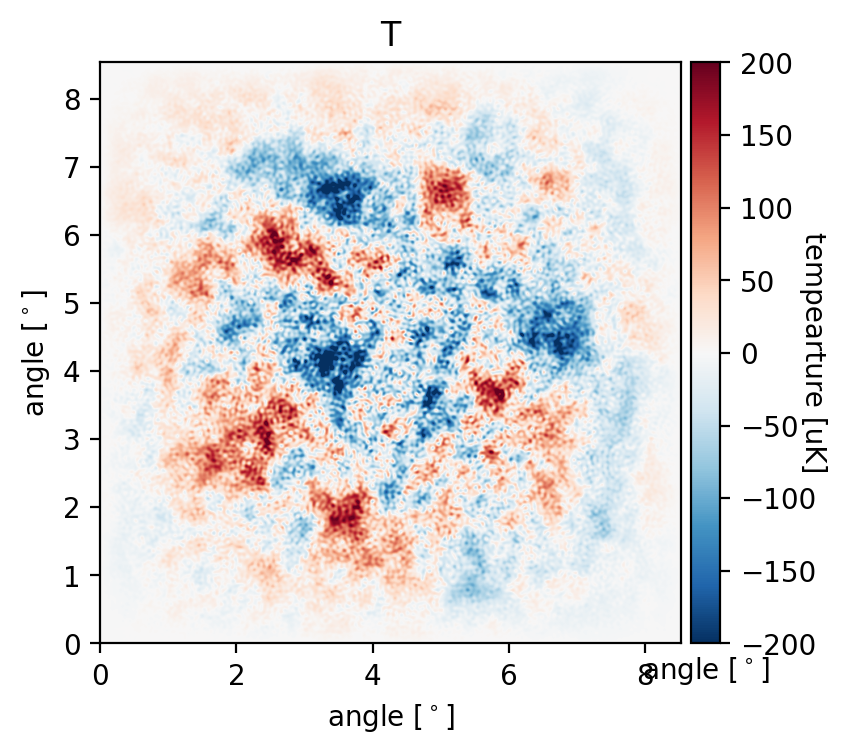

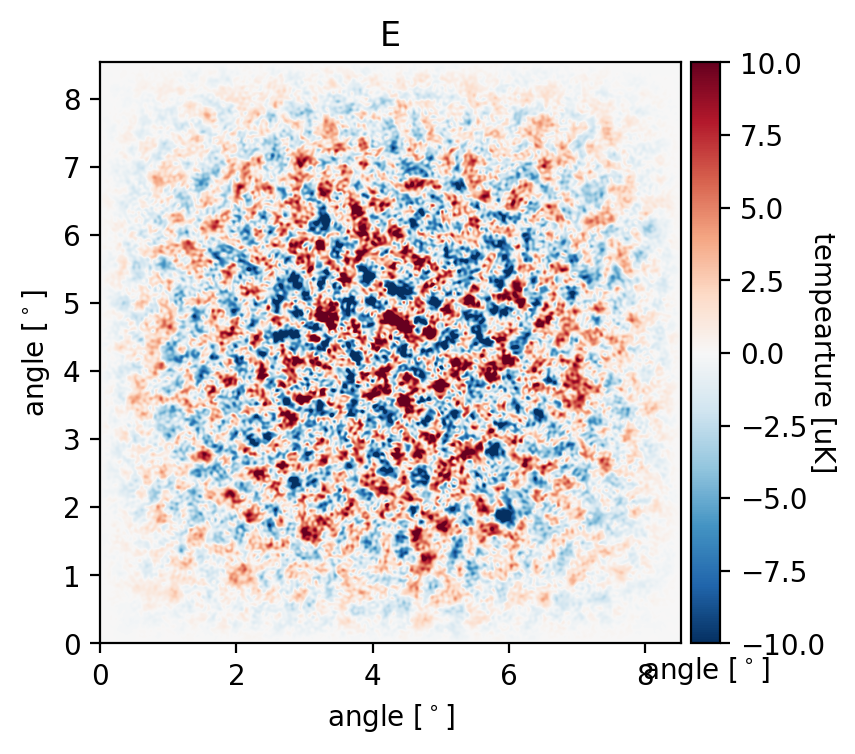

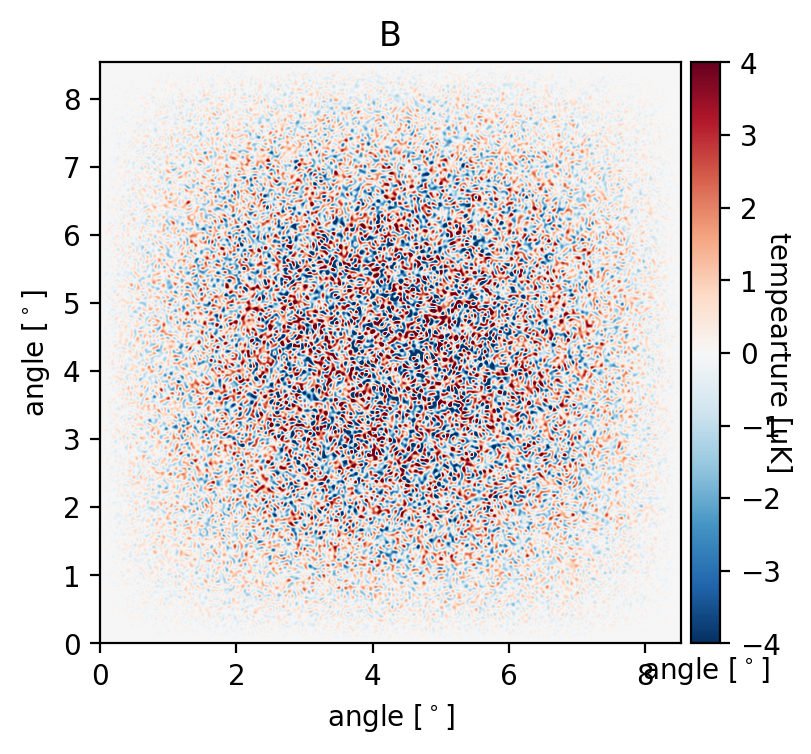

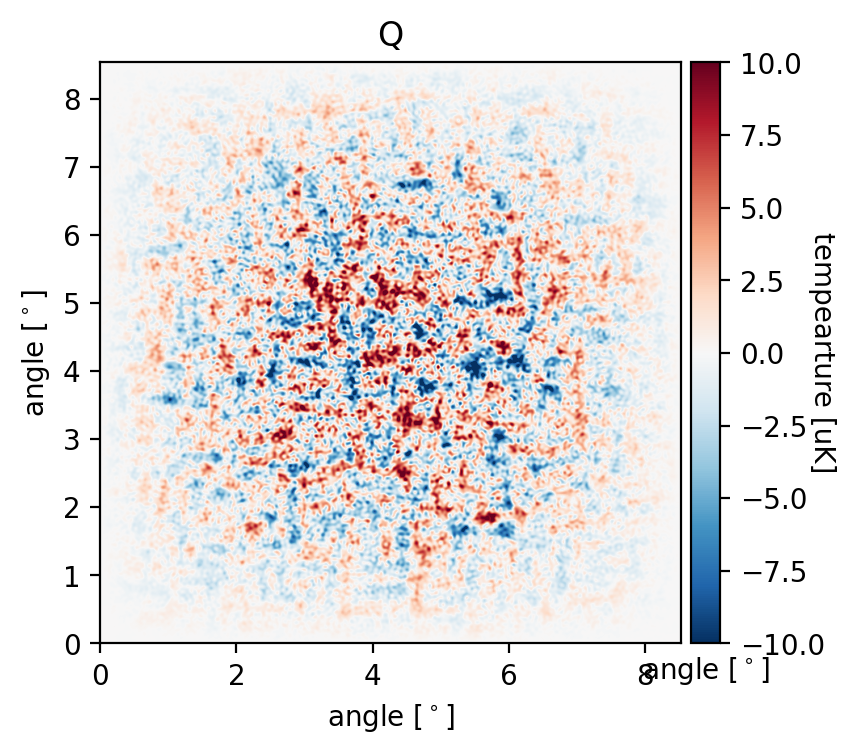

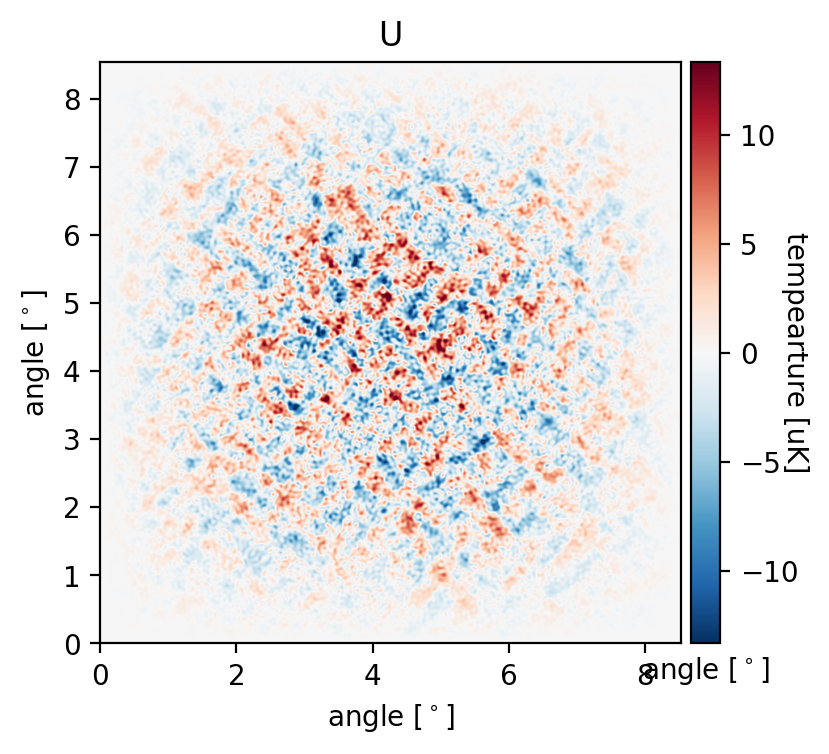

In [13]:
# MAPPE ORIGINALI

plt.title("T")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(T_map,c_min,c_max,X_width,Y_width)

plt.title("E")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_map,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("B")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_map,c_min/50.,c_max/50.,X_width,Y_width)

plt.title("Q")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map ,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("U")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map,c_min/15.,c_max/15.,X_width,Y_width)

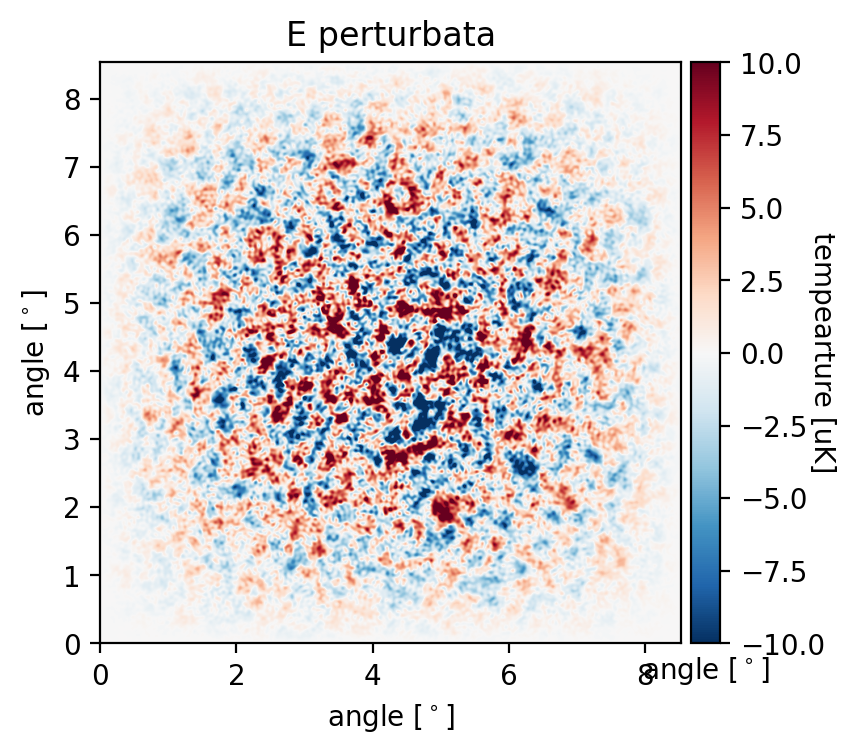

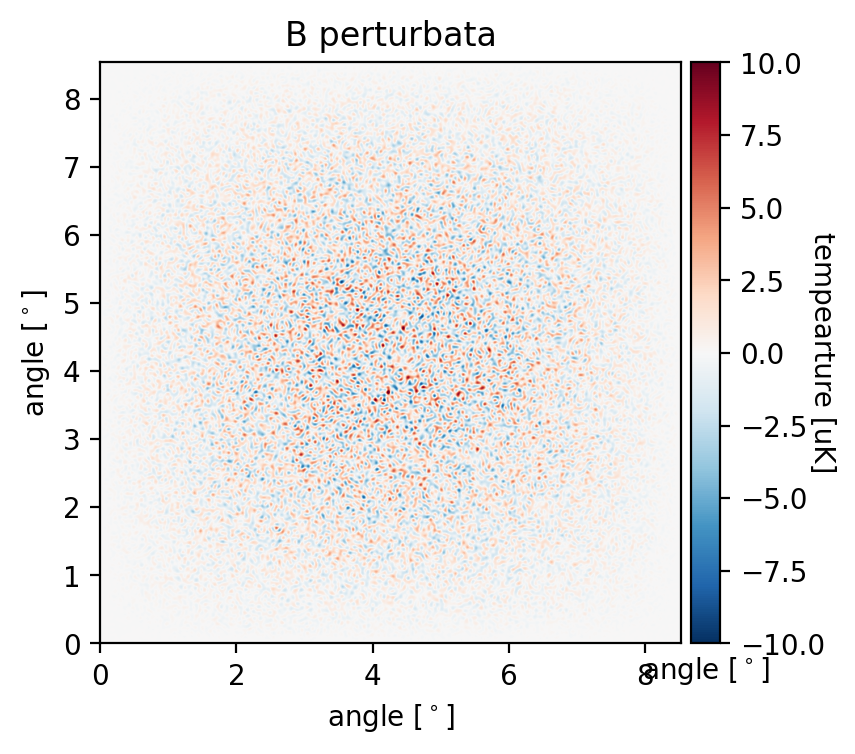

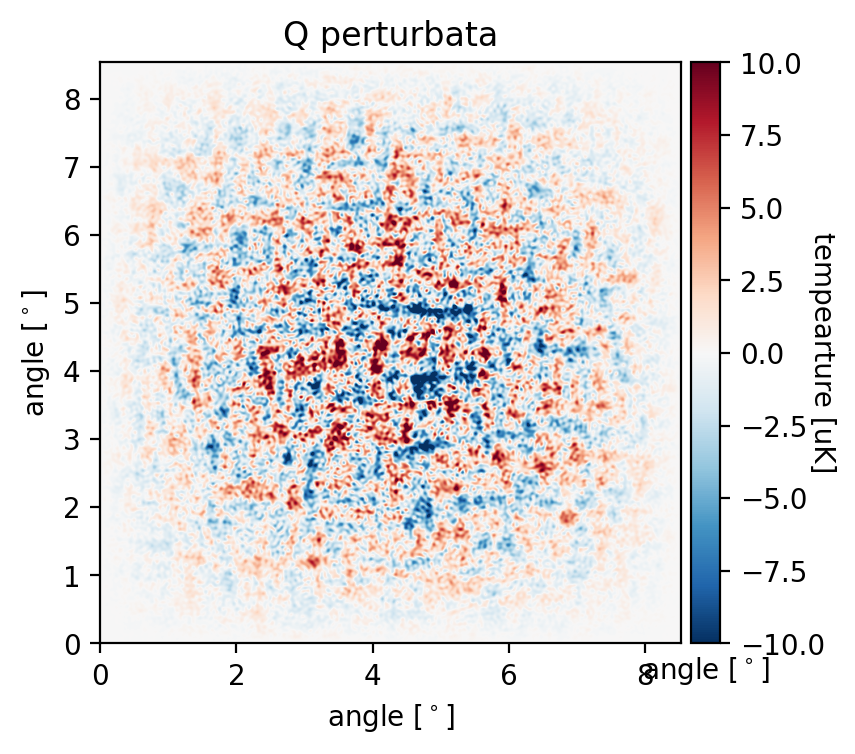

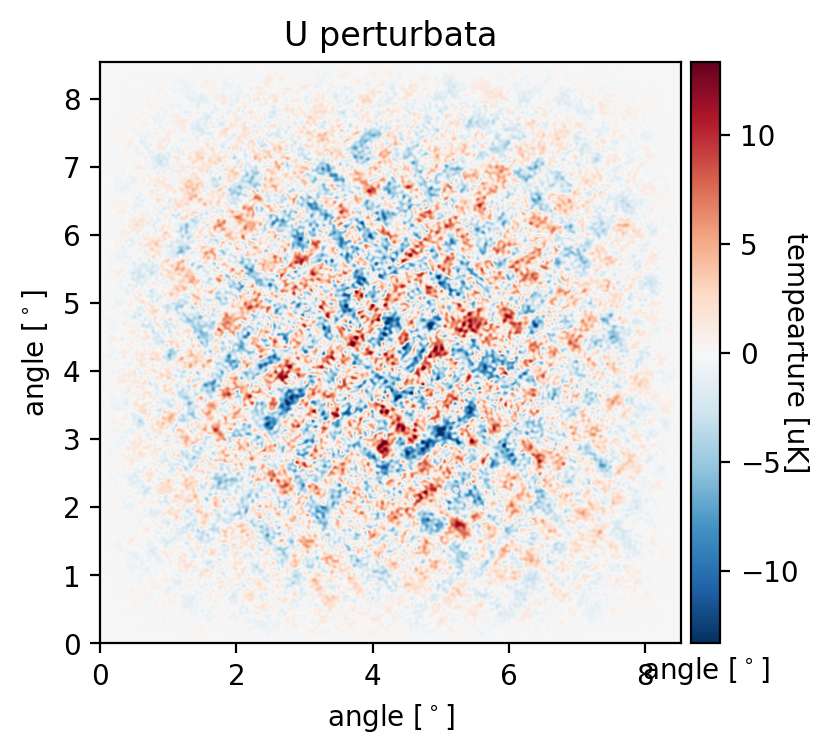

In [14]:
# MAPPE PERTURBATE

plt.title("E perturbata")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(E_map_pert,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("B perturbata")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(B_map_pert,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("Q perturbata")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(Q_map_pert ,c_min/20.,c_max/20.,X_width,Y_width)

plt.title("U perturbata")
plt.ylabel('angle $[^\circ]$')
plt.xlabel('angle $[^\circ]$')
p = Plot_CMB_Map(U_map_pert,c_min/15.,c_max/15.,X_width,Y_width)

# Polarizzazione

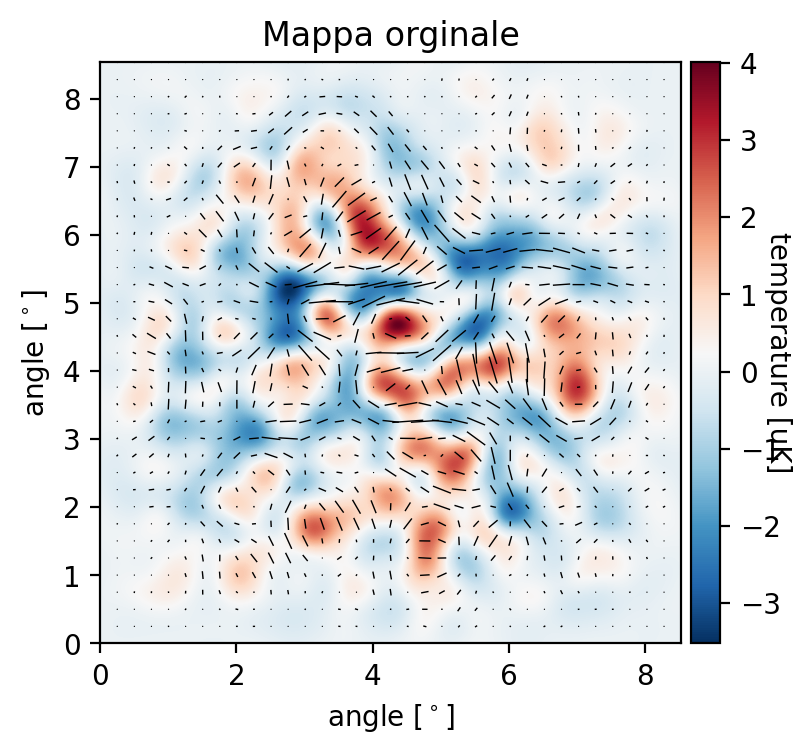

In [15]:
title_og = "Mappa orginale"
pol_map  = plotquiver(N,Q_map,U_map,X_width,Y_width, pix_size,title_og,background=E_map)

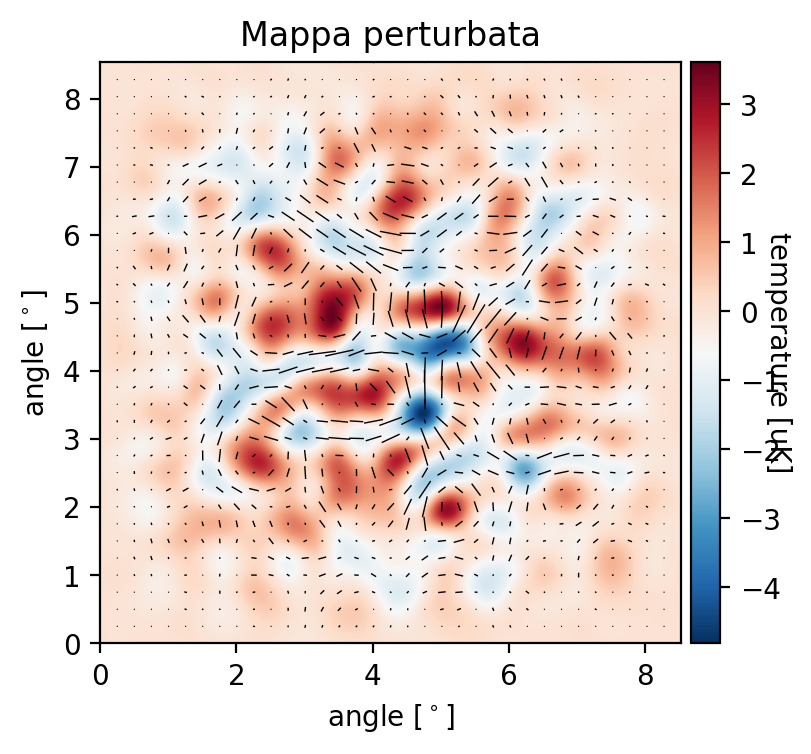

In [16]:
title_og = "Mappa perturbata"
pol_map_pert = plotquiver(N,Q_map_pert,U_map_pert,X_width,Y_width, pix_size, title_og,background=E_map_pert)

# Analysis

In [17]:
delta_l = 50.
l_max   = 2500

binned_l_T, binned_spectrum_T = calculate_2d_spectrum(T_map,T_map,delta_l,l_max,pix_size,N)
binned_l_E, binned_spectrum_E = calculate_2d_spectrum(E_map,E_map,delta_l,l_max,pix_size,N)
binned_l_B, binned_spectrum_B = calculate_2d_spectrum(B_map,B_map,delta_l,l_max,pix_size,N)

binned_l_E_pert, binned_spectrum_E_pert = calculate_2d_spectrum(E_map_pert,E_map_pert,delta_l,l_max,pix_size,N)
binned_l_B_pert, binned_spectrum_B_pert = calculate_2d_spectrum(B_map_pert,B_map_pert,delta_l,l_max,pix_size,N)

In [18]:
# ci mette un po' 

beam_size_fwhp    = 1.25
white_noise_level = 0.5
atmospheric_noise_level = 0.1 * 0 #azzerato
one_over_f_noise_level  = 0.2 * 0 #azzerato

# TRANSFER FUNCTION - multiplicative bias
N_iterations  = 16
signal_only_T = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_E = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_B = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_E_pert = np.zeros([N_iterations,int(l_max/delta_l)])
signal_only_B_pert = np.zeros([N_iterations,int(l_max/delta_l)])

i = 0

while (i < N_iterations):
    #map_T, map_Q, map_U, map_E, map_B = make_CMB_maps(N,pix_size,ls,TT_ps,EE_ps,TE_ps,BB_ps)
    #map_T_pert, map_Q_pert, map_U_pert, map_E_pert, map_B_pert = make_CMB_maps(N,pix_size,ls,TT_ps,EE_ps_pert,TE_ps,BB_ps_pert)
    
    
    map_convolved_T = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,T_map)
    map_convolved_E = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,E_map)
    map_convolved_B = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,B_map)
        
    map_convolved_E_pert = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,E_map_pert)
    map_convolved_B_pert = convolve_map_with_gaussian_beam(N,pix_size,beam_size_fwhp,B_map_pert)
    
    binned_l_cur_T, binned_spectrum_cur_T = calculate_2d_spectrum(map_convolved_T*window, map_convolved_T*window,delta_l,l_max,pix_size,N)
    binned_l_cur_E, binned_spectrum_cur_E = calculate_2d_spectrum(map_convolved_E*window, map_convolved_E*window,delta_l,l_max,pix_size,N)
    binned_l_cur_B, binned_spectrum_cur_B = calculate_2d_spectrum(map_convolved_B*window, map_convolved_B*window,delta_l,l_max,pix_size,N)
   
    binned_l_cur_E_pert, binned_spectrum_cur_E_pert = calculate_2d_spectrum(map_convolved_E_pert*window, map_convolved_E_pert*window,delta_l,l_max,pix_size,N)
    binned_l_cur_B_pert, binned_spectrum_cur_B_pert = calculate_2d_spectrum(map_convolved_B_pert*window, map_convolved_B_pert*window,delta_l,l_max,pix_size,N)
    
    signal_only_T[i,:] = binned_spectrum_cur_T
    sys.stdout.flush()
    signal_only_E[i,:] = binned_spectrum_cur_E
    sys.stdout.flush()
    signal_only_B[i,:] = binned_spectrum_cur_B
    sys.stdout.flush()
    signal_only_E_pert[i,:] = binned_spectrum_cur_E_pert
    sys.stdout.flush()
    signal_only_B_pert[i,:] = binned_spectrum_cur_B_pert
    sys.stdout.flush()
    i = i + 1
    
sig_only_mean_spectrum_T, rms_T = average_N_spectra(signal_only_T,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_E, rms_E = average_N_spectra(signal_only_E,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_B, rms_B = average_N_spectra(signal_only_B,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_E_pert, rms_E_pert = average_N_spectra(signal_only_E_pert,N_iterations,int(l_max/delta_l))
sig_only_mean_spectrum_B_pert, rms_B_pert = average_N_spectra(signal_only_B_pert,N_iterations,int(l_max/delta_l))


sub_sampled_CLs_T = TT_ps[binned_l_T] * 2. * np.pi / (binned_l_T * (binned_l_T+1.))
sub_sampled_CLs_E = EE_ps[binned_l_E] * 2. * np.pi / (binned_l_E * (binned_l_E+1.))
sub_sampled_CLs_B = BB_ps[binned_l_B] * 2. * np.pi / (binned_l_B * (binned_l_B+1.))
sub_sampled_CLs_E_pert = EE_ps[binned_l_E_pert] * 2. * np.pi / (binned_l_E_pert * (binned_l_E_pert+1.))
sub_sampled_CLs_B_pert = BB_ps[binned_l_B_pert] * 2. * np.pi / (binned_l_B_pert * (binned_l_B_pert+1.))


Multiplicative_Bias_est_T =  sub_sampled_CLs_T / sig_only_mean_spectrum_T
Multiplicative_Bias_est_E =  sub_sampled_CLs_E / sig_only_mean_spectrum_E
Multiplicative_Bias_est_B =  sub_sampled_CLs_B / sig_only_mean_spectrum_B
Multiplicative_Bias_est_E_pert =  sub_sampled_CLs_E_pert / sig_only_mean_spectrum_E_pert
Multiplicative_Bias_est_B_pert =  sub_sampled_CLs_B_pert / sig_only_mean_spectrum_B_pert



# NOISE - noise bias
noise_only = np.zeros([N_iterations,int(l_max/delta_l)])
i = 0

while (i <N_iterations):
    Noise = make_noise_map(N,pix_size,white_noise_level,atmospheric_noise_level,one_over_f_noise_level)
    binned_l_cur, binned_spectrum_cur = calculate_2d_spectrum(Noise*window,Noise*window,delta_l,l_max,pix_size,N)
    
    noise_only[i,:] = binned_spectrum_cur
    sys.stdout.flush()
    i = i + 1

noise_only_mean_spectrum, rms_not_needed = average_N_spectra(noise_only,N_iterations,int(l_max/delta_l))
Additive_Bias_est = noise_only_mean_spectrum

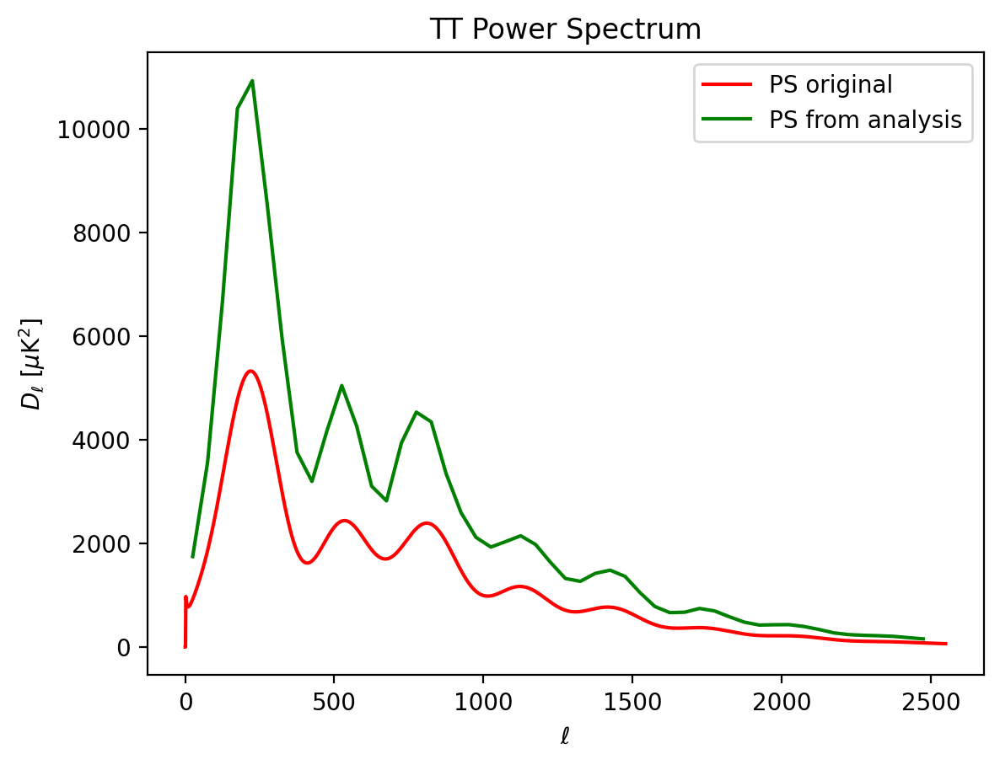

In [19]:
#plt.plot(binned_l_T,binned_spectrum_T* binned_l_T * (binned_l_T+1.)/2. / np.pi,color='b', label="PS from analysis")

plt.plot(ls,Original_PS[0], label="PS original", c="r")

plt.plot(binned_l_T,(binned_spectrum_T - noise_only_mean_spectrum) * Multiplicative_Bias_est_T*\
             binned_l_T * (binned_l_T+1.)/2. / np.pi,color='g', label="PS from analysis") #corretto

plt.title("TT Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

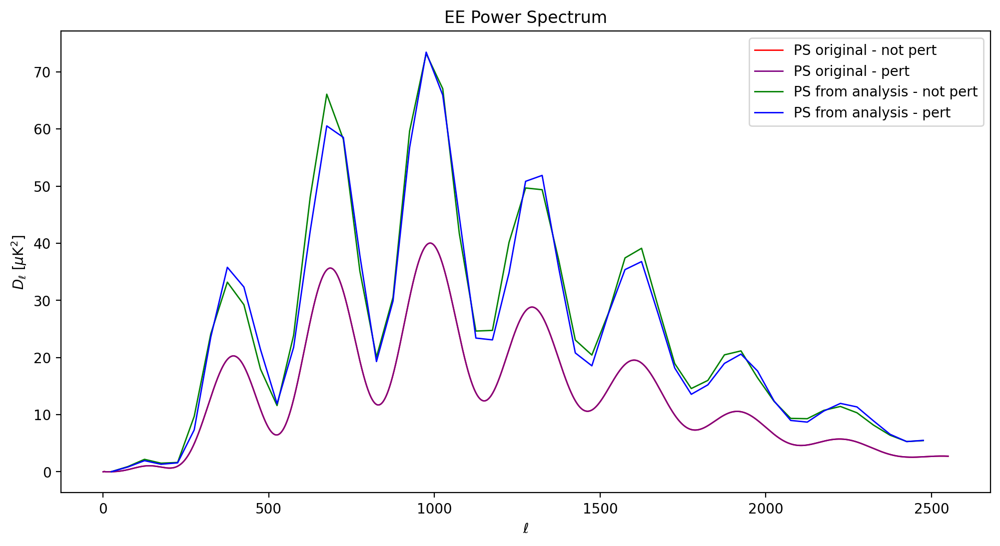

In [20]:
#plt.plot(binned_l_E,binned_spectrum_E* binned_l_E * (binned_l_E+1.)/2. / np.pi,color='b', label="PS from analysis") non corretto

plt.figure(figsize=(12, 6))

plt.plot(ls,Original_PS[2], label="PS original - not pert", c="r", linewidth=1)
plt.plot(ls,EE_ps_pert, label="PS original - pert", c="purple", linewidth=1)

plt.plot(binned_l_E,(binned_spectrum_E - noise_only_mean_spectrum) * Multiplicative_Bias_est_E*\
             binned_l_E * (binned_l_E+1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)

plt.plot(binned_l_E_pert,(binned_spectrum_E_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_pert*\
             binned_l_E_pert * (binned_l_E_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)

plt.title("EE Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

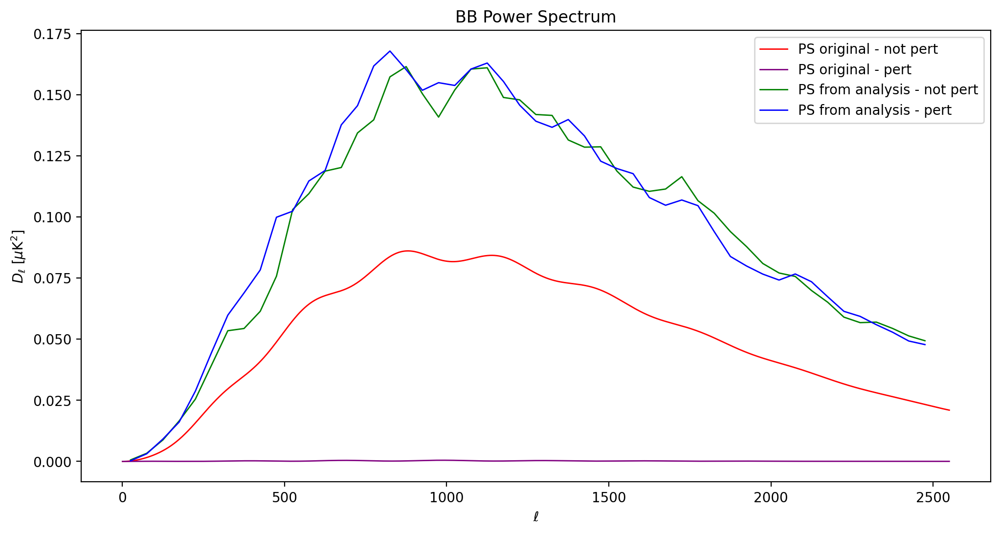

In [21]:
plt.figure(figsize=(12, 6))

plt.plot(ls,Original_PS[3], label="PS original - not pert", c="r", linewidth=1)
plt.plot(ls,BB_ps_pert, label="PS original - pert", c="purple", linewidth=1)

plt.plot(binned_l_B,(binned_spectrum_B - noise_only_mean_spectrum) * Multiplicative_Bias_est_B*\
             binned_l_B * (binned_l_B +1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)

plt.plot(binned_l_B_pert,(binned_spectrum_B_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_pert*\
             binned_l_B_pert * (binned_l_B_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)


plt.title("BB Power Spectrum")
plt.ylabel('$D_{\ell}$ [$\mu$K$^2$]')
plt.xlabel('$\ell$')
plt.legend()

# Immagini

### Confronto mappe

In [22]:
map_list = [E_map, B_map, Q_map, U_map, E_map_pert, B_map_pert, Q_map_pert, U_map_pert]
title_list = ["E_map", "B_map", "Q_map", "U_map", "E_map_pert", "B_map_pert", "Q_map_pert", "U_map_pert"]

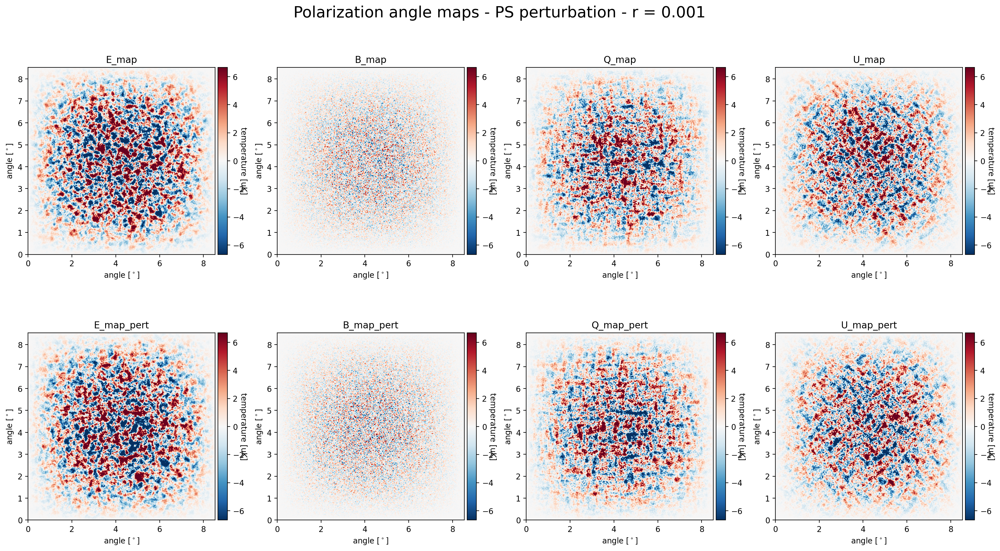

In [23]:
fig, axs = plt.subplots(2, 4, figsize=(18, 10))
axs = axs.flatten()


for i, map_data in enumerate(map_list):

        Plot_CMB_Map_compact(axs[i], map_data, c_min/30, c_max/30, X_width, Y_width)
        axs[i].set_title(title_list[i])
        
plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.suptitle('Polarization angle maps - PS perturbation - r = 0.001', fontsize=20) #  cambio titolo se cambio r 
plt.savefig('C:/Users/guide/Documents/University/TESI/immagini/Maps_PSpert_001.png')  
plt.show()

### Confronto PS originali e perturbati E e B

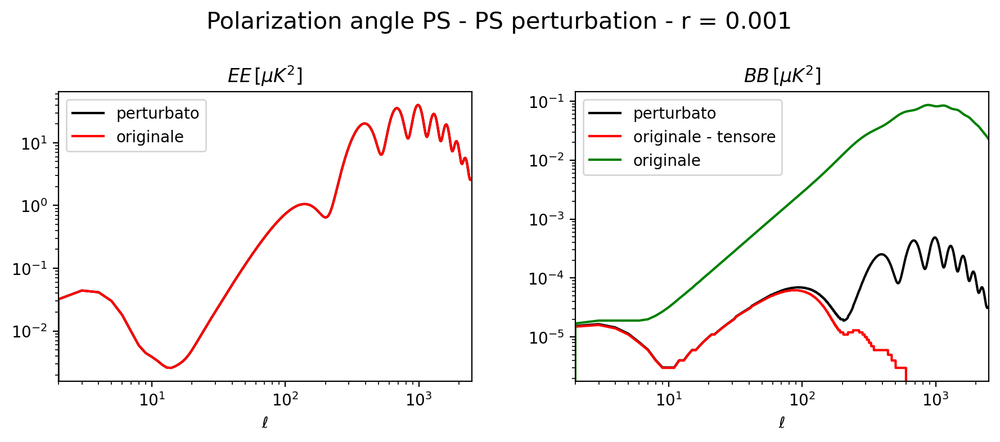

In [24]:
fig, ax = plt.subplots(1, 2, figsize=(9, 4))  

ax[0].loglog(ls,EE_ps_pert, color='k', label='perturbato')
ax[0].loglog(ls,EE_ps, color='r', label='originale')
ax[0].set_title(r'$EE\, [\mu K^2]$')
ax[0].legend()

ax[1].loglog(ls,BB_ps_pert, color='k', label='perturbato')
ax[1].loglog(ls,BB_ps_tensor, color='r', label='originale - tensore')
ax[1].loglog(ls,BB_ps, color='g', label='originale')
ax[1].set_title(r'$BB\, [\mu K^2]$')
ax[1].legend()

for ax in ax.reshape(-1): 
    ax.set_xlim([2,2500])
    ax.set_xlabel(r'$\ell$')

plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.80)
plt.suptitle('Polarization angle PS - PS perturbation - r = 0.001', fontsize=15)
plt.savefig('C:/Users/guide/Documents/University/TESI/immagini/PSpert_PSpert_001.png')  #cambio nome
plt.show()

 ### Confronto PS originali, perturbati e ricavati dall'analisi E e B

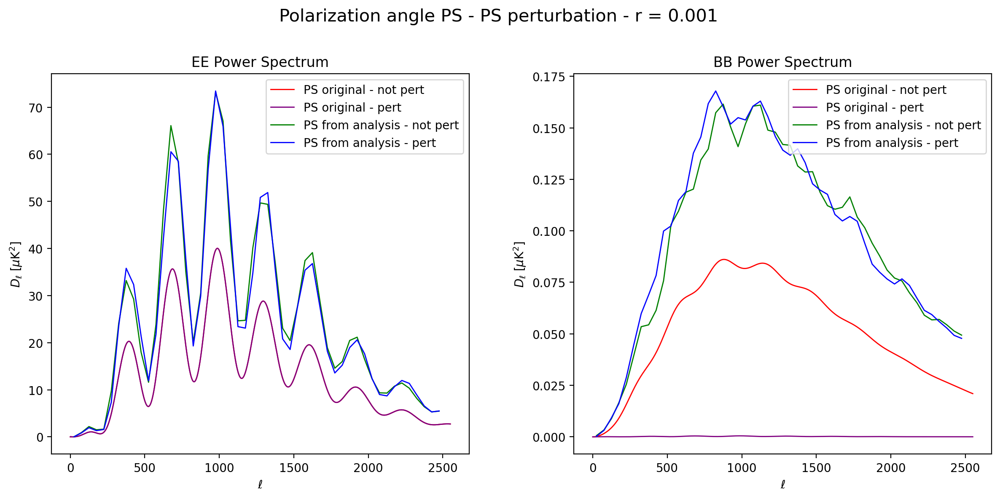

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(12, 6))  


ax[0].plot(ls,Original_PS[2], label="PS original - not pert", c="r", linewidth=1)
ax[0].plot(ls,EE_ps_pert, label="PS original - pert", c="purple", linewidth=1)
ax[0].plot(binned_l_E,(binned_spectrum_E - noise_only_mean_spectrum) * Multiplicative_Bias_est_E*\
             binned_l_E * (binned_l_E+1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)
ax[0].plot(binned_l_E_pert,(binned_spectrum_E_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_pert*\
             binned_l_E_pert * (binned_l_E_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)

ax[0].set_title("EE Power Spectrum")
ax[0].set_ylabel('$D_{\ell}$ [$\mu$K$^2$]')
ax[0].set_xlabel('$\ell$')
ax[0].legend()

#

ax[1].plot(ls,Original_PS[3], label="PS original - not pert", c="r", linewidth=1)
ax[1].plot(ls,BB_ps_pert, label="PS original - pert", c="purple", linewidth=1)

ax[1].plot(binned_l_B,(binned_spectrum_B - noise_only_mean_spectrum) * Multiplicative_Bias_est_B*\
             binned_l_B * (binned_l_B +1.)/2. / np.pi,color='green', label="PS from analysis - not pert", linewidth=1)

ax[1].plot(binned_l_B_pert,(binned_spectrum_B_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_pert*\
             binned_l_B_pert * (binned_l_B_pert+1.)/2. / np.pi,color='blue', label="PS from analysis - pert", linewidth=1)


ax[1].set_title("BB Power Spectrum")
ax[1].set_ylabel('$D_{\ell}$ [$\mu$K$^2$]')
ax[1].set_xlabel('$\ell$')
ax[1].legend()

#

plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.85)
plt.suptitle('Polarization angle PS - PS perturbation - r = 0.001', fontsize=15)
plt.savefig('C:/Users/guide/Documents/University/TESI/immagini/PS_PSpert_001.png')  #cambio nome
plt.show()

# Salvataggio

In [26]:
stacked_matrices = np.vstack((E_map_pert, B_map_pert,Q_map_pert,U_map_pert))
stacked_PS = np.vstack(((binned_spectrum_E_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_E_pert*\
             binned_l_E_pert * (binned_l_E_pert+1.)/2. / np.pi, (binned_spectrum_B_pert - noise_only_mean_spectrum) * Multiplicative_Bias_est_B_pert*\
             binned_l_B_pert * (binned_l_B_pert+1.)/2. / np.pi))

In [27]:
np.savetxt('C:/Users/guide/Documents/University/TESI/dati/Maps_PSpert_001.txt', stacked_matrices, fmt='%.21f')

np.savetxt('C:/Users/guide/Documents/University/TESI/dati/EB_PS_PSpert_001.txt', stacked_PS, fmt='%.20f')